In [2]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import matplotlib.pyplot as plt
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.layers import Dropout
from keras.applications.resnet50 import preprocess_input
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.regularizers import l2




2024-12-24 17:12:07.746727: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-24 17:12:07.747037: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-24 17:12:07.748848: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-12-24 17:12:07.753860: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1735049527.762532    4972 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1735049527.76

In [6]:
# Paths
TRAIN_DIR = "organized_dataset/train"  # Path to your organized dataset
VALIDATION_SPLIT = 0.25  # Split 20% of training data for validation
IMAGE_SIZE = (224, 224)  # Input size for ResNet50
BATCH_SIZE = 32  # Adjust based on your hardware
NUM_CLASSES = len(os.listdir(TRAIN_DIR))  # Count subdirectories (one per landmark)
EPOCHS = 40  # Adjust based on the size of your dataset
LEARNING_RATE = 1e-5


In [7]:
# Data Augmentation for Training
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    validation_split=VALIDATION_SPLIT
)


# Training Generator
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
)

# Validation Generator
validation_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# Print class indices for reference
print("Class indices:", train_generator.class_indices)


Found 2494 images belonging to 14 classes.
Found 822 images belonging to 14 classes.
Class indices: {'10618': 0, '126637': 1, '151942': 2, '171772': 3, '176528': 4, '177870': 5, '192931': 6, '20409': 7, '41808': 8, '45428': 9, '62074': 10, '62798': 11, '83144': 12, '84689': 13}


In [8]:
# Training Class Counts
train_class_counts = np.bincount(train_generator.classes)
print("Training class counts:")
for class_label, class_index in train_generator.class_indices.items():
    print(f"{class_label}: {train_class_counts[class_index]}")

# Validation Class Counts
val_class_counts = np.bincount(validation_generator.classes)
print("\nValidation class counts:")
for class_label, class_index in validation_generator.class_indices.items():
    print(f"{class_label}: {val_class_counts[class_index]}")

# Total Number of Images in Training and Validation
print(f"\nTotal training images: {train_generator.samples}")
print(f"Total validation images: {validation_generator.samples}")

Training class counts:
10618: 129
126637: 177
151942: 129
171772: 174
176528: 252
177870: 230
192931: 201
20409: 157
41808: 114
45428: 135
62074: 132
62798: 343
83144: 177
84689: 144

Validation class counts:
10618: 42
126637: 58
151942: 42
171772: 57
176528: 84
177870: 76
192931: 66
20409: 52
41808: 37
45428: 45
62074: 43
62798: 114
83144: 58
84689: 48

Total training images: 2494
Total validation images: 822


In [10]:
# Load ResNet50 Pre-trained on ImageNet
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add Custom Layers for Classification
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Pooling layer to reduce dimensions
x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.4)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)

# Define the Full Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the Base Model Layers
for layer in base_model.layers[-3:]:
    layer.trainable = False
    if hasattr(layer, 'kernel_regularizer'):  #
        layer.kernel_regularizer = l2(0.01)  


# Compile the Model
model.compile(optimizer=Adam(learning_rate=LEARNING_RATE),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Model Summary
model.summary()


2024-12-24 17:13:40.135441: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,643,982 (94.01 MB)

 Trainable params: 24,586,766 (93.79 MB)

 Non-trainable params: 57,216 (223.50 KB)

In [13]:
callbacks = [
    ModelCheckpoint("resnet50_landmark_model.keras", save_best_only=True, monitor="val_loss", mode="min"),
    EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True)
]


In [14]:
history = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=EPOCHS,
    callbacks=callbacks
   
)


/home/cankut/BOUN/SWE-583/Term-Project/google-landmark/venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 174s 2s/step - accuracy: 0.1309 - loss: 10.9984 - val_accuracy: 0.4209 - val_loss: 10.1160
Epoch 2/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.3813 - loss: 10.1149 - val_accuracy: 0.5596 - val_loss: 9.5756
Epoch 3/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.5305 - loss: 9.6158 - val_accuracy: 0.6144 - val_loss: 9.2726
Epoch 4/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 159s 2s/step - accuracy: 0.6070 - loss: 9.3047 - val_accuracy: 0.6606 - val_loss: 9.0695
Epoch 5/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.6602 - loss: 9.0513 - val_accuracy: 0.6873 - val_loss: 8.9465
Epoch 6/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.6936 - loss: 8.8665 - val_accuracy: 0.6813 - val_loss: 8.8149
Epoch 7/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.7061 - loss: 8.7679 - val_accuracy: 0.7032 - val_loss: 8.7248
Epoch 8/40
78/78 ━━━━━━━━━━━━━━━━━━━━ 158s 2s/step - accuracy: 0.7506 - loss: 8.5772 - val_accuracy: 0.7092 

In [ ]:
# Plot Training and Validation Loss
plt.figure(figsize=(12, 4))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 4))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


In [15]:
# Get validation predictions and true labels
validation_generator.reset()  # Ensure generator is at the start
predictions = model.predict(validation_generator)
y_pred = np.argmax(predictions, axis=1)  # Get predicted class indices
y_true = validation_generator.classes  # True labels
class_labels = list(validation_generator.class_indices.keys())  # Class names
# Ensure alignment
print(f"Predictions shape: {y_pred.shape}")
print(f"True labels shape: {y_true.shape}")

26/26 ━━━━━━━━━━━━━━━━━━━━ 12s 454ms/step
Predictions shape: (822,)
True labels shape: (822,)


In [16]:
# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_labels))


Classification Report:
              precision    recall  f1-score   support

       10618       0.63      0.76      0.69        42
      126637       0.86      0.88      0.87        58
      151942       0.59      0.69      0.64        42
      171772       0.98      1.00      0.99        57
      176528       0.74      0.71      0.73        84
      177870       0.81      0.76      0.78        76
      192931       0.73      0.82      0.77        66
       20409       0.95      1.00      0.97        52
       41808       0.65      0.41      0.50        37
       45428       0.72      0.73      0.73        45
       62074       0.88      0.98      0.92        43
       62798       0.77      0.78      0.78       114
       83144       0.93      0.88      0.90        58
       84689       0.72      0.54      0.62        48

    accuracy                           0.79       822
   macro avg       0.78      0.78      0.78       822
weighted avg       0.79      0.79      0.79       822



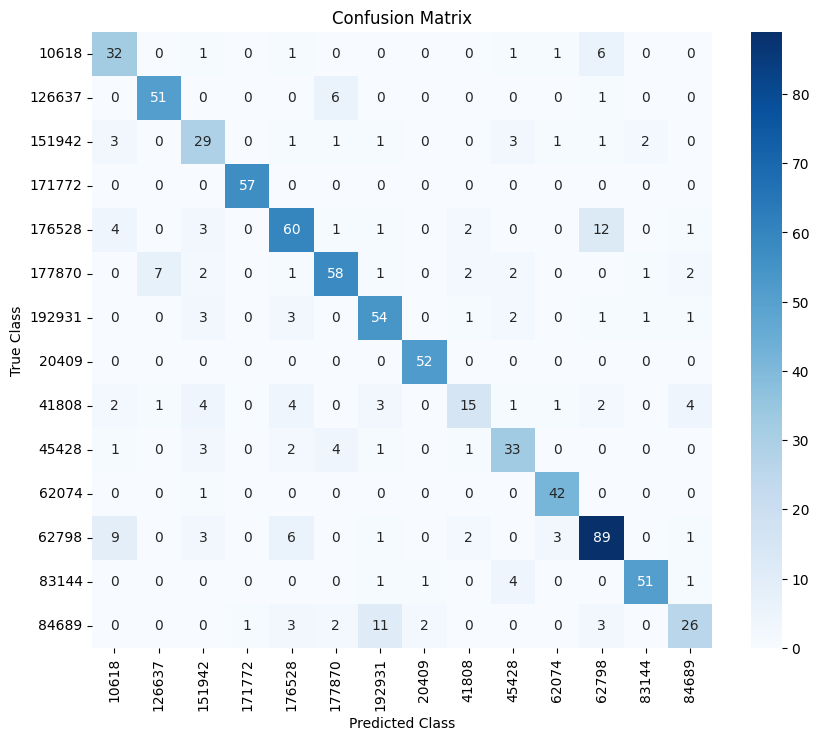

In [27]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.title("Confusion Matrix")
plt.show()


In [37]:
def collect_unique_image_ids(generator, y_true, y_pred, num_classes):
    image_ids = {label: {"anchor": None, "correct": None, "incorrect": None} for label in range(num_classes)}
    used_ids = set()  # Track used image IDs to avoid duplicates

    # Iterate over all images in the generator
    for idx, filename in enumerate(generator.filenames):
        image_id = os.path.splitext(os.path.basename(filename))[0]  # Extract image ID
        true_label = y_true[idx]
        pred_label = y_pred[idx]

        # Skip if this image ID has already been used
        if image_id in used_ids:
            continue

        # Assign to anchor, correct, or incorrect
        if image_ids[true_label]["anchor"] is None:
            image_ids[true_label]["anchor"] = image_id
            used_ids.add(image_id)
            continue

        if true_label == pred_label and image_ids[true_label]["correct"] is None:
            image_ids[true_label]["correct"] = image_id
            used_ids.add(image_id)
            continue

        if true_label != pred_label and image_ids[true_label]["incorrect"] is None:
            image_ids[true_label]["incorrect"] = image_id
            used_ids.add(image_id)
            continue

        # Stop early if all samples are found for all classes
        if all(all(v is not None for v in image_ids[label].values()) for label in range(num_classes)):
            break

    return image_ids

# Collect unique image IDs
image_ids = collect_unique_image_ids(validation_generator, y_true, y_pred, len(class_labels))
print(image_ids)


{0: {'anchor': '00341da6090ad8a7', 'correct': '003c04779fe63f7e', 'incorrect': '008a9abf0f200bf8'}, 1: {'anchor': '000b0d1da1f48a3f', 'correct': '0014ed3f568a680e', 'incorrect': '01706f052df9aaf2'}, 2: {'anchor': '003fe9bccff65d1f', 'correct': '0121b9454eb23937', 'incorrect': '0054e366eeff7c75'}, 3: {'anchor': '00026f17ba458f83', 'correct': '00140e80a9622fc3', 'incorrect': None}, 4: {'anchor': '0027e91121bc9db0', 'correct': '0029f7afb9a95af0', 'incorrect': '009e3813fdd06384'}, 5: {'anchor': '0012bf225d9196ad', 'correct': '00440f1714cc3b8c', 'incorrect': '012f8c0847703102'}, 6: {'anchor': '0026ac2a96735d2c', 'correct': '007e306768c0ed57', 'incorrect': '00d27d731d722f6d'}, 7: {'anchor': '0001a9da1acabb52', 'correct': '0012ae7cae66b6bc', 'incorrect': None}, 8: {'anchor': '0015a8c83ab06136', 'correct': '010fc2b861cfde9f', 'incorrect': '00aab0ca3e5d0485'}, 9: {'anchor': '0017bd7722749cd3', 'correct': '003ffe136428f5c2', 'incorrect': '007a14a079ee51f1'}, 10: {'anchor': '0034134ff15b1c8e', 'c

In [38]:
# Map image IDs to file paths
def map_image_ids_to_paths(data_dir):
    image_path_map = {}
    for root, _, files in os.walk(data_dir):
        for file in files:
            if file.endswith(".jpg"):
                image_id = file.split(".")[0]  # Extract the image ID from the filename
                image_path_map[image_id] = os.path.join(root, file)
    return image_path_map

# Recursively map image IDs
data_dir = "organized_dataset/train"  # Adjust this to your organized dataset directory
image_path_map = map_image_ids_to_paths(data_dir)


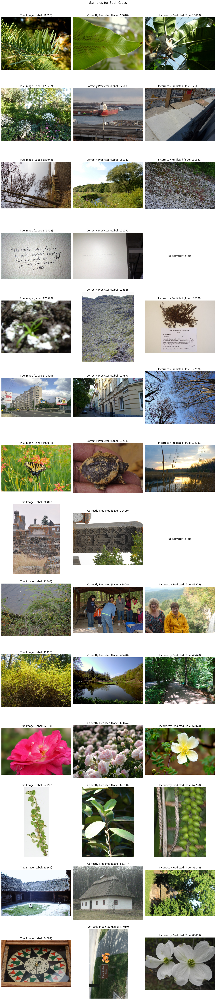

In [39]:
from PIL import Image

# Deprocessing function (if needed)
def deprocess_image(image):
    mean_values = np.array([123.68, 116.779, 103.939])  # ResNet mean values
    image += mean_values
    image = np.clip(image, 0, 255).astype(np.uint8)
    return image

# Plot images for each class
fig, axes = plt.subplots(len(class_labels), 3, figsize=(15, len(class_labels) * 5))
fig.suptitle("Samples for Each Class", fontsize=16)

for i, label in enumerate(range(len(class_labels))):
    anchor_id = image_ids[label]["anchor"]
    correct_id = image_ids[label]["correct"]
    incorrect_id = image_ids[label]["incorrect"]

    anchor_path = image_path_map.get(str(anchor_id), None)
    correct_path = image_path_map.get(str(correct_id), None)
    incorrect_path = image_path_map.get(str(incorrect_id), None)

    # Load images
    anchor_image = Image.open(anchor_path) if anchor_path else None
    correct_image = Image.open(correct_path) if correct_path else None
    incorrect_image = Image.open(incorrect_path) if incorrect_path else None

    # Plot images
    if anchor_image:
        axes[i, 0].imshow(anchor_image)
        axes[i, 0].set_title(f"True Image (Label: {class_labels[label]})")
    else:
        axes[i, 0].text(0.5, 0.5, "Missing Anchor", ha="center", va="center")
    axes[i, 0].axis("off")

    if correct_image:
        axes[i, 1].imshow(correct_image)
        axes[i, 1].set_title(f"Correctly Predicted (Label: {class_labels[label]})")
    else:
        axes[i, 1].text(0.5, 0.5, "No Correct Prediction", ha="center", va="center")
    axes[i, 1].axis("off")

    if incorrect_image:
        axes[i, 2].imshow(incorrect_image)
        axes[i, 2].set_title(f"Incorrectly Predicted (True: {class_labels[label]})")
    else:
        axes[i, 2].text(0.5, 0.5, "No Incorrect Prediction", ha="center", va="center")
    axes[i, 2].axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()
